# **Import Dataset From Drive**

In [1]:
import pandas as pd
data=pd.read_csv(r"/content/drive/MyDrive/Colab Notebooks/Crop_Data.csv")

# **Analyze The Data**

In [2]:
data.head()

,Crop,Season,State,Area,Soil Type,Pesticide Usage,pH,Temperature,Fertilizer Usage,Price,Rainfall
0,Cotton(lint),Kharif,Assam,1739.0,Black Soil,low,Average,Medium,High,2490.092421,3373.2
1,Onion,Whole Year,Assam,7832.0,Alluvial Soil,high,Low,Low,Medium,2348.904922,3520.7
2,Potato,Whole Year,Assam,75259.0,Laterile Soil,low,Average,High,High,2448.287513,2957.4
3,Rice,Autumn,Assam,607358.0,Alluvial Soil,low,Low,High,High,2714.419518,3079.6
4,Rice,Summer,Assam,174974.0,Black Soil,high,Low,Low,Low,2883.356997,2566.7


In [3]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5373 entries, 0 to 5372
Data columns (total 11 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   Crop              5373 non-null   object 
 1   Season            5373 non-null   object 
 2   State             5373 non-null   object 
 3   Area              5373 non-null   float64
 4   Soil Type         5373 non-null   object 
 5   Pesticide Usage   5373 non-null   object 
 6   pH                5373 non-null   object 
 7   Temperature       5373 non-null   object 
 8   Fertilizer Usage  5373 non-null   object 
 9   Price             5373 non-null   float64
 10  Rainfall          5373 non-null   float64
dtypes: float64(3), object(8)
memory usage: 461.9+ KB


# **Handaling Null Values**

In [4]:
data.isnull().sum()/len(data)

,0
Crop,0.0
Season,0.0
State,0.0
Area,0.0
Soil Type,0.0
Pesticide Usage,0.0
pH,0.0
Temperature,0.0
Fertilizer Usage,0.0
Price,0.0


## **Statical Analysis**

In [5]:
data.describe().T

,count,mean,std,min,25%,50%,75%,max
Area,5373.0,394538.865698,1.060867e+06,1.0,2590.000000,22596.000000,211000.000000,10216517.0
Price,5373.0,2553.190129,4.837197e+02,1005.0,2297.975728,2508.496079,2733.320514,4983.0
Rainfall,5373.0,1496.015241,8.785391e+02,62.3,852.500000,1218.400000,2068.050000,6331.1


# **Check Dublicates**

In [6]:
data.duplicated().sum()

0

In [7]:
data['Crop'].unique()

array(['Cotton(lint)', 'Onion', 'Potato', 'Rice', 'Sugarcane', 'Wheat',
       'Groundnut', 'Ragi', 'Banana'], dtype=object)

In [8]:
data['Crop'].value_counts()

,count
Crop,
Rice,1197
Groundnut,725
Potato,628
Sugarcane,605
Wheat,545
Ragi,498
Cotton(lint),476
Onion,454
Banana,245


In [9]:
data

,Crop,Season,State,Area,Soil Type,Pesticide Usage,pH,Temperature,Fertilizer Usage,Price,Rainfall
0,Cotton(lint),Kharif,Assam,1739.0,Black Soil,low,Average,Medium,High,2490.092421,3373.20
1,Onion,Whole Year,Assam,7832.0,Alluvial Soil,high,Low,Low,Medium,2348.904922,3520.70
2,Potato,Whole Year,Assam,75259.0,Laterile Soil,low,Average,High,High,2448.287513,2957.40
3,Rice,Autumn,Assam,607358.0,Alluvial Soil,low,Low,High,High,2714.419518,3079.60
4,Rice,Summer,Assam,174974.0,Black Soil,high,Low,Low,Low,2883.356997,2566.70
...,...,...,...,...,...,...,...,...,...,...,...
5368,Wheat,Summer,Odisha,147.0,Black Soil,high,Average,High,High,3707.000000,821.39
5369,Rice,Kharif,Nagaland,141000.0,Black Soil,high,Average,Medium,Medium,3406.000000,2988.96
5370,Wheat,Rabi,Nagaland,1000.0,Black Soil,high,High,Low,High,3949.000000,1492.70
5371,Rice,Kharif,Jammu and Kashmir,275746.0,Black Soil,low,High,High,High,2842.000000,1688.34


# **Explotary Data Analysis (EDA)**

In [23]:
import matplotlib.pyplot as plt
import seaborn as sns

# **Numerical Feautheres Analysis**

<Axes: title={'center': 'Price'}, ylabel='Frequency'>

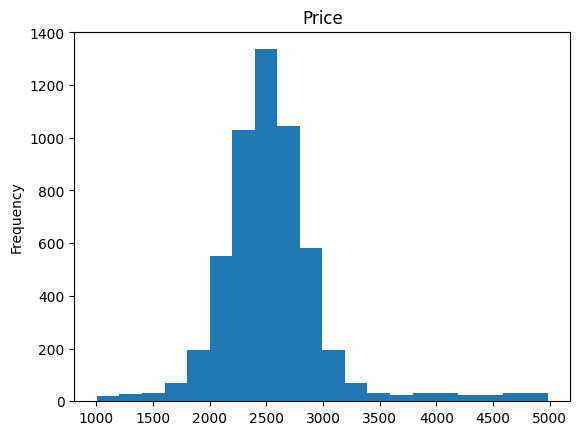

In [11]:
data['Price'].plot(kind='hist', bins=20, title='Price')


See, the price of the crop is nearly normally distributed, with a mean and median of 2500 per 1 quintal.


<Axes: title={'center': 'Rainfall'}, ylabel='Frequency'>

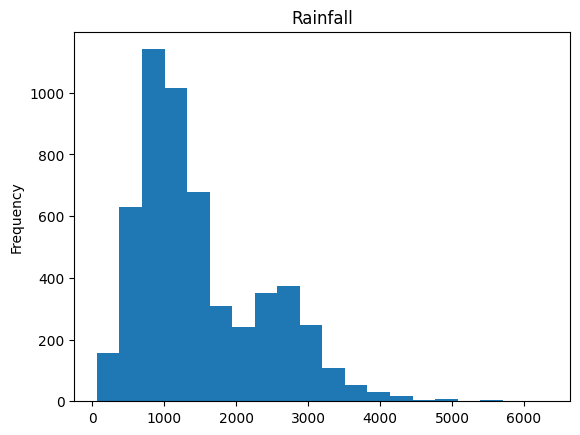

In [12]:
data['Rainfall'].plot(kind = 'hist',bins =20,title = 'Rainfall')

Rainfall is often right-skewed, with most occurrences around 900 units, while the average rainfall is 1,400 units. Occasionally, extreme rainfall of 4,000 or 5,000 units can occur, which leads to challenging situations and a definite increase in crop prices.


<Axes: xlabel='Price', ylabel='Rainfall'>

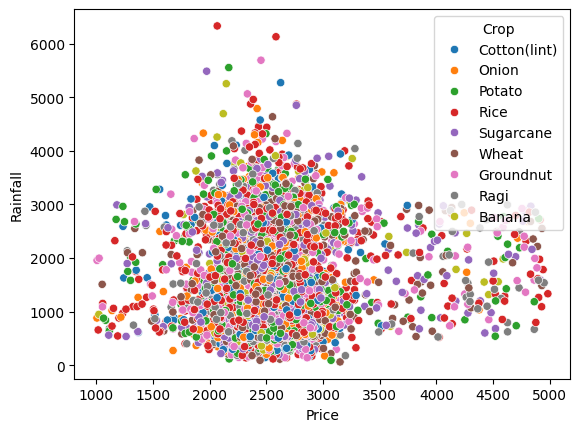

In [13]:
sns.scatterplot(x='Price',y='Rainfall',data=data,hue='Crop')


<Axes: xlabel='Price', ylabel='Area'>

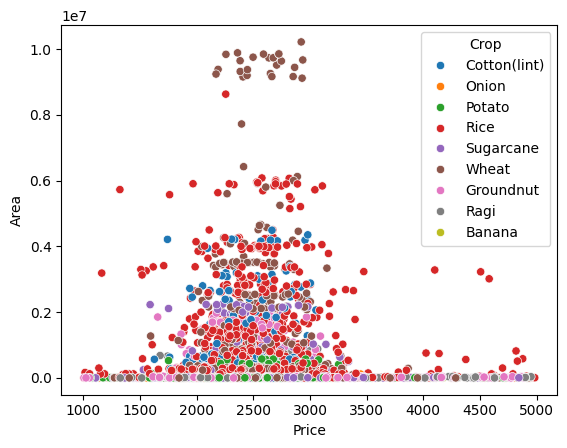

In [14]:
sns.scatterplot(x='Price',y='Area',data=data,hue='Crop')


Guys, listen. As the area of production increased, the price didn’t rise significantly. While the average area of production expanded, the demand for the product decreased. I want to mention that after the Pasumipuritchi (Green Revolution), crop yields increased, but prices did not rise accordingly, and the nutritional value also declined.

# **Categorical Feautheres Analysis**

In [15]:
cat_column = data.select_dtypes(include='object').columns
cat_column

Index(['Crop', 'Season', 'State', 'Soil Type', 'Pesticide Usage', 'pH',
       'Temperature', 'Fertilizer Usage'],
      dtype='object')

<ipython-input-24-f2d961f53be3>:7: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  colors = plt.cm.get_cmap('RdYlGn')(price_by_category.values / price_by_category.max())


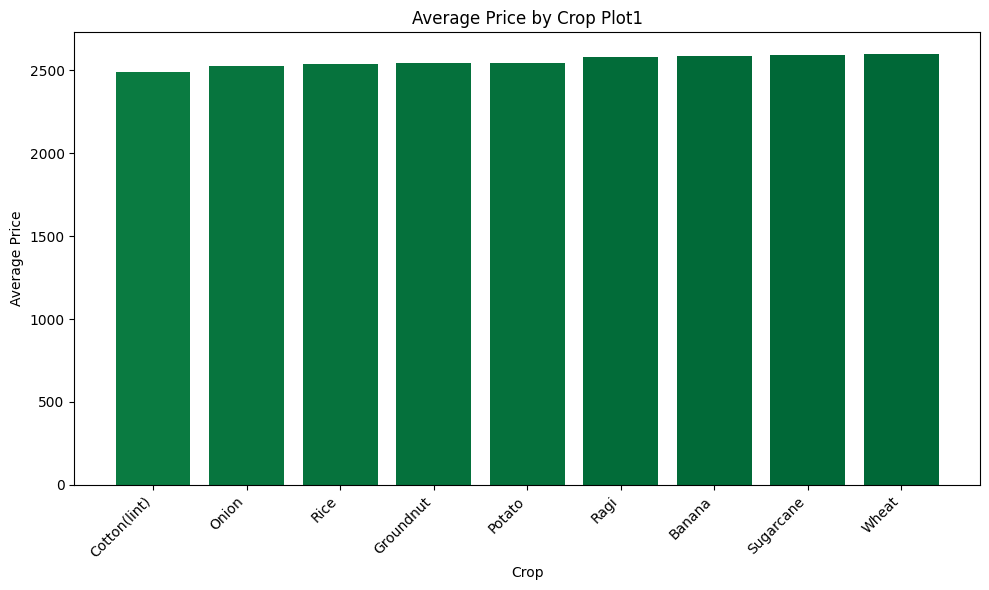

<ipython-input-24-f2d961f53be3>:7: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  colors = plt.cm.get_cmap('RdYlGn')(price_by_category.values / price_by_category.max())


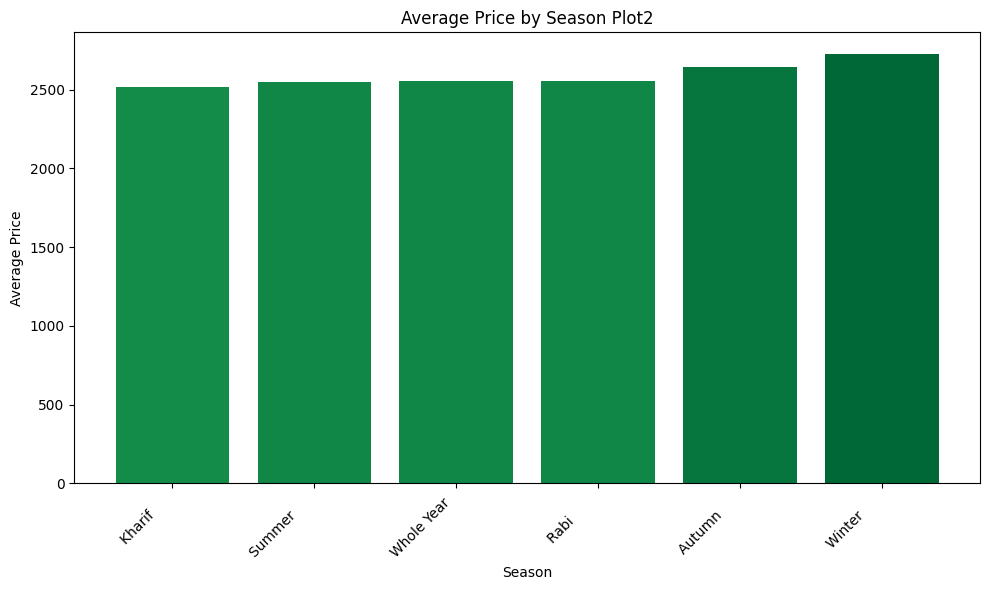

<ipython-input-24-f2d961f53be3>:7: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  colors = plt.cm.get_cmap('RdYlGn')(price_by_category.values / price_by_category.max())


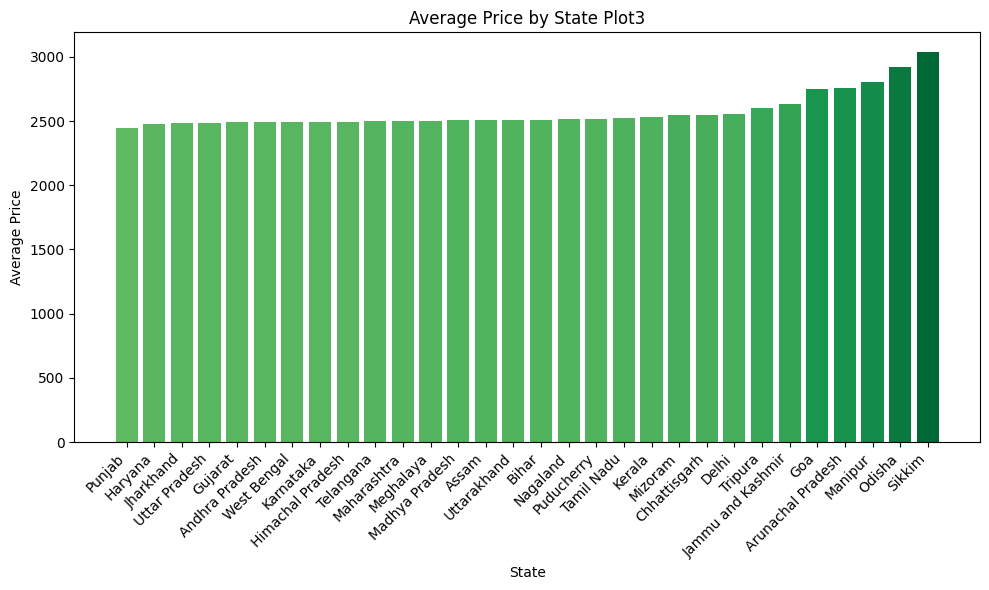

<ipython-input-24-f2d961f53be3>:7: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  colors = plt.cm.get_cmap('RdYlGn')(price_by_category.values / price_by_category.max())


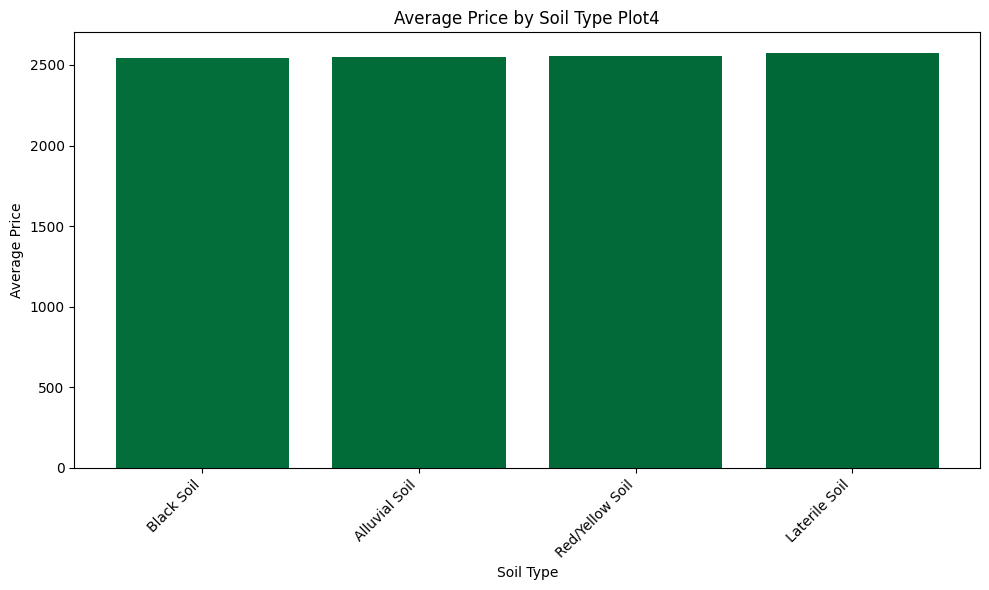

<ipython-input-24-f2d961f53be3>:7: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  colors = plt.cm.get_cmap('RdYlGn')(price_by_category.values / price_by_category.max())


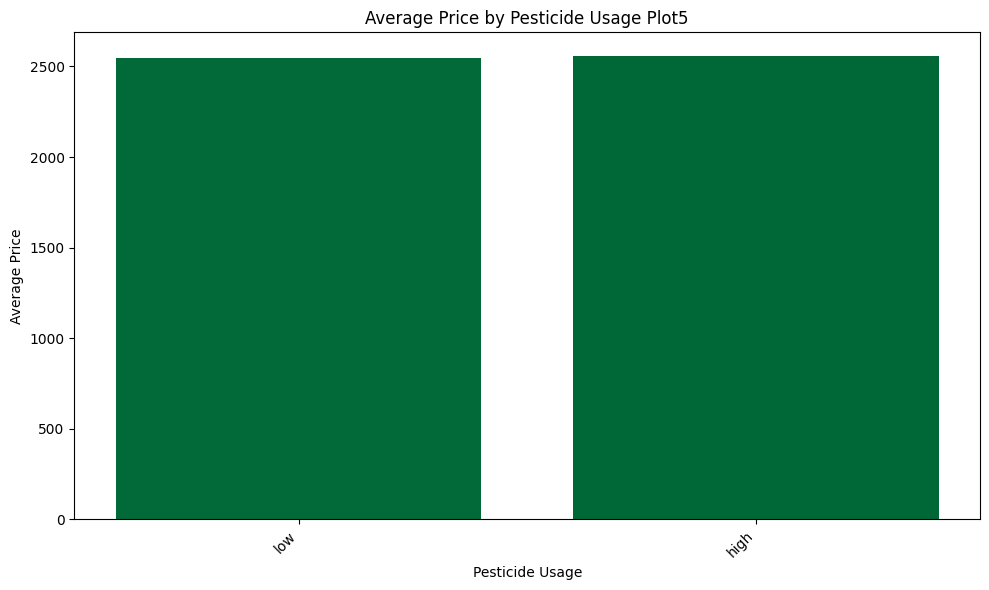

<ipython-input-24-f2d961f53be3>:7: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  colors = plt.cm.get_cmap('RdYlGn')(price_by_category.values / price_by_category.max())


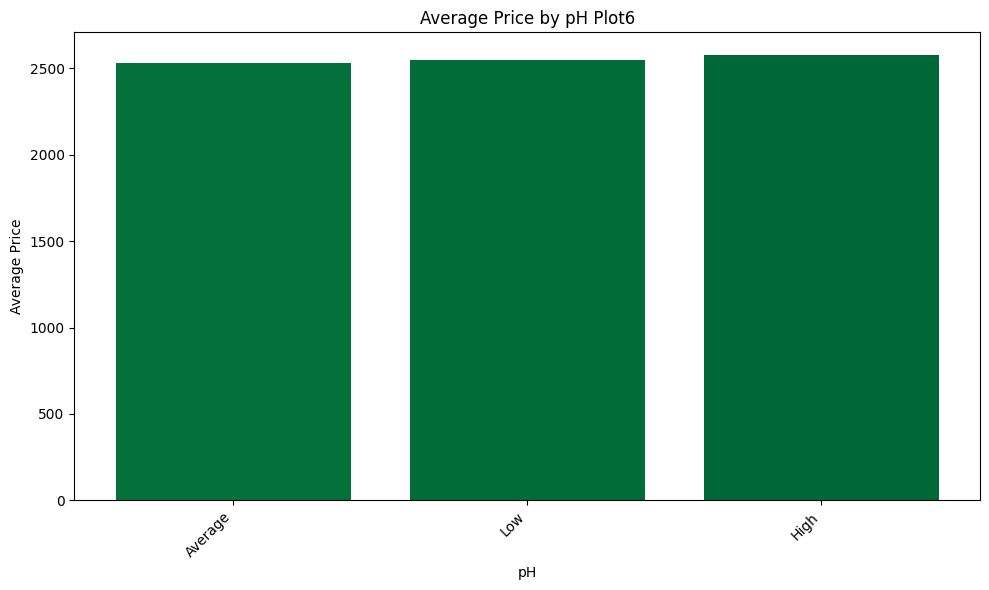

<ipython-input-24-f2d961f53be3>:7: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  colors = plt.cm.get_cmap('RdYlGn')(price_by_category.values / price_by_category.max())


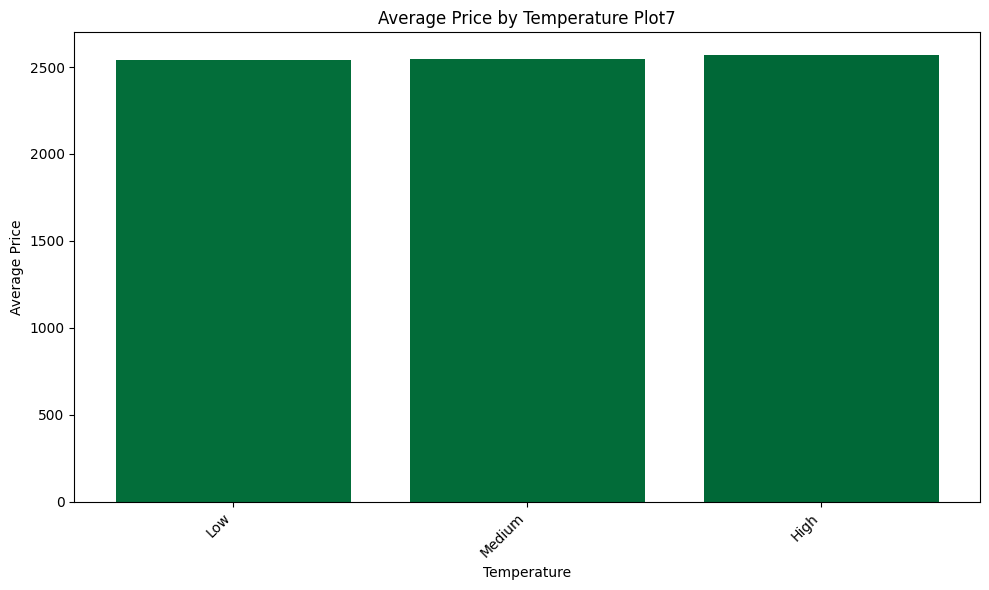

<ipython-input-24-f2d961f53be3>:7: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  colors = plt.cm.get_cmap('RdYlGn')(price_by_category.values / price_by_category.max())


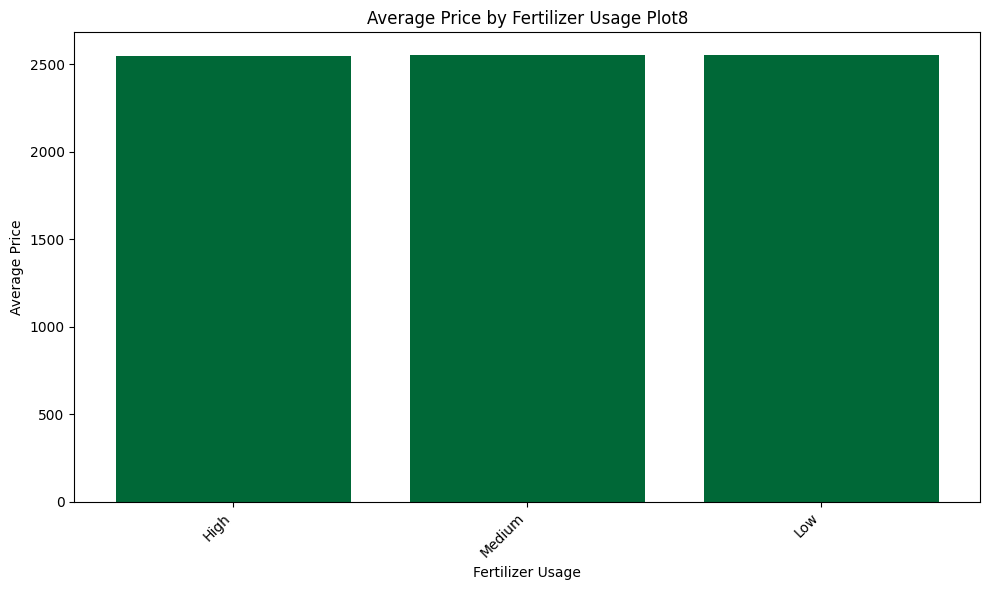

In [24]:
i=1
for col in cat_column:
  # Calculate the mean price for each category
  price_by_category = data.groupby(col)['Price'].mean().sort_values()

  # Create a color map based on the price values
  colors = plt.cm.get_cmap('RdYlGn')(price_by_category.values / price_by_category.max())

  # Plot the bar chart
  plt.figure(figsize=(10, 6))
  plt.bar(price_by_category.index, price_by_category.values, color=colors)
  plt.xlabel(col)
  plt.ylabel('Average Price')
  plt.title(f'Average Price by {col} Plot{i}')
  plt.xticks(rotation=45, ha='right')
  plt.tight_layout()
  plt.show()
  i+=1


1.for the conculusion about plot is Average surcane and Wheet prize is high,2.Punjab,Haryanna,udhrapradesh,jorhand this area crop prize low the resion i am reserched this area have lot of fertilizer indestries have hear fertilizer cost quit low, but sikiem,odisa,manipur have high crop price , 3.

<ipython-input-25-c9696a6e1626>:5: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  colors = plt.cm.get_cmap('viridis')(fertilizer_by_state.values / fertilizer_by_state.max())


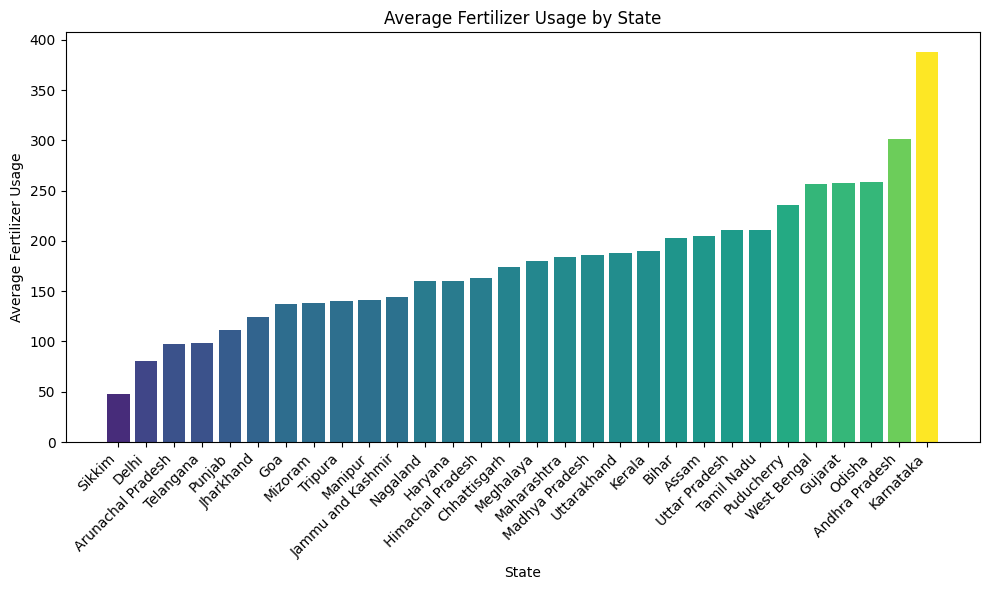

In [25]:
# Calculate the average fertilizer usage for each state
fertilizer_by_state = data.groupby('State')['Fertilizer Usage'].size().sort_values()

# Create a color map based on the fertilizer usage values
colors = plt.cm.get_cmap('viridis')(fertilizer_by_state.values / fertilizer_by_state.max())

# Plot the bar chart
plt.figure(figsize=(10, 6))
plt.bar(fertilizer_by_state.index, fertilizer_by_state.values, color=colors)
plt.xlabel('State')
plt.ylabel('Average Fertilizer Usage')
plt.title('Average Fertilizer Usage by State')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()


<ipython-input-26-3b5a8a4fa020>:7: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  colors = plt.cm.get_cmap('viridis')(Crop_yiled_by_Season.values / Crop_yiled_by_Season.max())


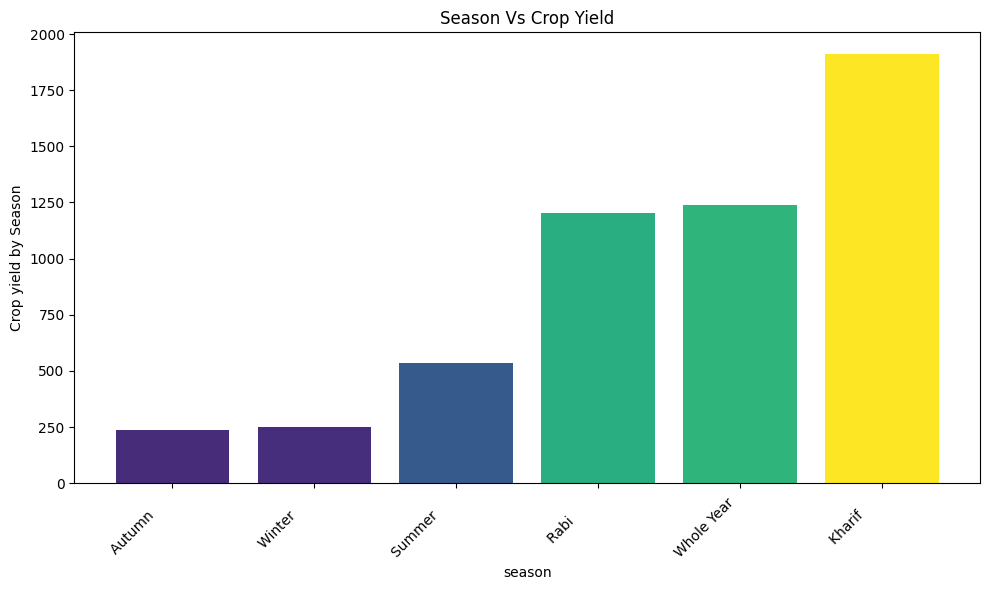

In [26]:
import matplotlib.pyplot as plt

# Calculate the average yiled for each season
Crop_yiled_by_Season = data.groupby('Season')['Crop'].size().sort_values()

# Create a color map based on the crop yiled values
colors = plt.cm.get_cmap('viridis')(Crop_yiled_by_Season.values / Crop_yiled_by_Season.max())

# Plot the bar chart
plt.figure(figsize=(10, 6))
plt.bar(Crop_yiled_by_Season.index, Crop_yiled_by_Season.values, color=colors)
plt.xlabel('season')
plt.ylabel('Crop yield by Season')
plt.title('Season Vs Crop Yield')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()


My average price by season and my seasonal yield are highly correlated. For example, in autumn and winter, the yield is low, while the price is high.

Kharif is the rainy season in India when farmers plant their crops. During this time, fertilizer prices are high, but crop prices tend to be low.

The season is highly correlated with various factors such as price, fertilizer use, and pesticide usage.

<ipython-input-27-379944aa7f73>:7: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  colors = plt.cm.get_cmap('viridis')(fertilizer_by_Crop.values / fertilizer_by_Crop.max())


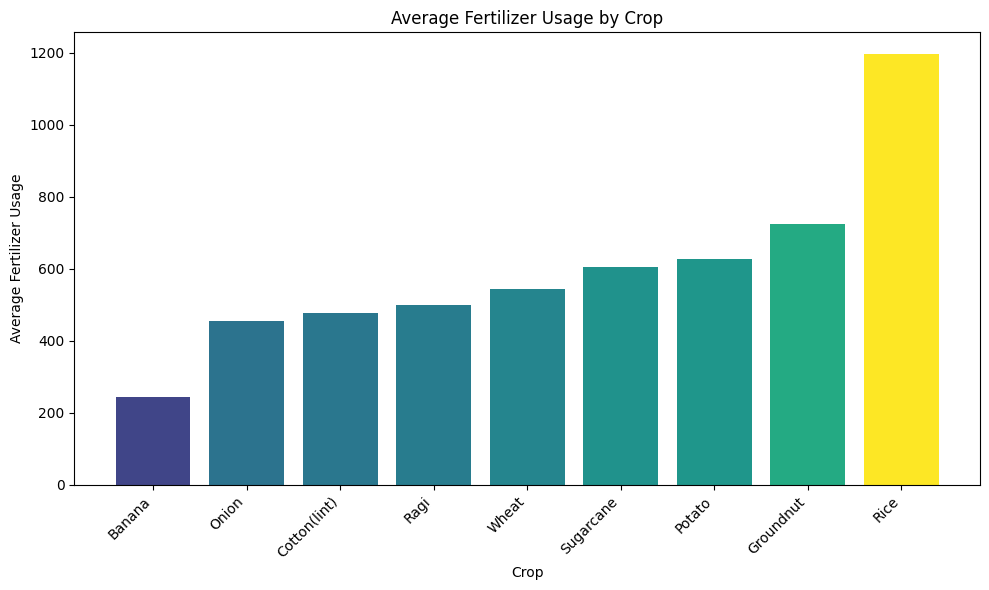

In [27]:
import matplotlib.pyplot as plt

# Calculate the average fertilizer usage for each crop
fertilizer_by_Crop = data.groupby('Crop')['Fertilizer Usage'].size().sort_values()

# Create a color map based on the fertilizer usage crop values
colors = plt.cm.get_cmap('viridis')(fertilizer_by_Crop.values / fertilizer_by_Crop.max())

# Plot the bar chart
plt.figure(figsize=(10, 6))
plt.bar(fertilizer_by_Crop.index, fertilizer_by_Crop.values, color=colors)
plt.xlabel('Crop')
plt.ylabel('Average Fertilizer Usage')
plt.title('Average Fertilizer Usage by Crop')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

<ipython-input-28-d9fb18e33912>:7: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  colors = plt.cm.get_cmap('viridis')(Pesticide_Usage_by_Season.values / Pesticide_Usage_by_Season.max())


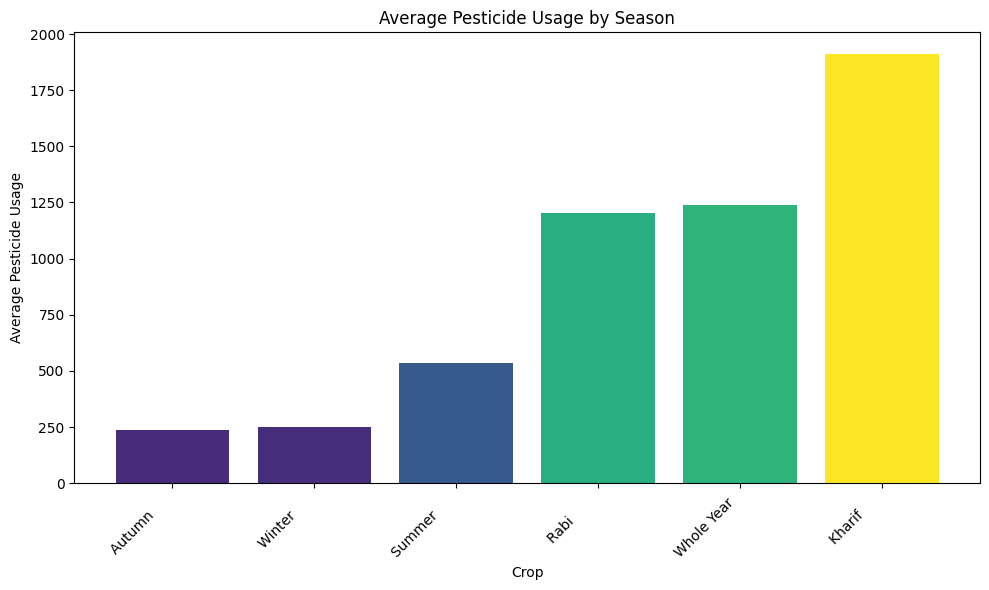

In [28]:
import matplotlib.pyplot as plt

# Calculate the average Pesticide usage for each Season
Pesticide_Usage_by_Season = data.groupby('Season')['Pesticide Usage'].size().sort_values()

# Create a color map based on the Pesticide usage values
colors = plt.cm.get_cmap('viridis')(Pesticide_Usage_by_Season.values / Pesticide_Usage_by_Season.max())

# Plot the bar chart
plt.figure(figsize=(10, 6))
plt.bar(Pesticide_Usage_by_Season.index, Pesticide_Usage_by_Season.values, color=colors)
plt.xlabel('Crop')
plt.ylabel('Average Pesticide Usage')
plt.title('Average Pesticide Usage by Season')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()


The Kharif season is a good time for planting, as it marks the beginning of the rainy season. Everyone eagerly waits for this season to start planting, and with the first rain, plant growth is usually strong. During this season, pesticides are widely used, which is why pesticide usage is high in the Kharif season.

In [32]:
!pip install ydata-profiling --upgrade

  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 356.2/356.2 kB 23.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 296.5/296.5 kB 5.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 686.1/686.1 kB 35.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 104.8/104.8 kB 9.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.5/4.5 MB 51.5 MB/s eta 0:00:00
  Created wheel for htmlmin: filename=htmlmin-0.1.12-py3-none-any.whl size=27081 sha256=659fe0485e060df289e638f76ac7cd872cc89e0c27241373810aa2460b6ba826
  Stored in directory: /root/.cache/pip/wheels/dd/91/29/a79cecb328d01739e64017b6fb9a1ab9d8cb1853098ec5966d
Successfully built htmlmin


# **EDA** **Using ydata prfiling**

In [34]:

import pandas as pd
from ydata_profiling import ProfileReport



# Generate the report
profile = ProfileReport(data)

# Display the report
profile.to_widgets()



/usr/local/lib/python3.10/dist-packages/ydata_profiling/profile_report.py:533: UserWarning: Ipywidgets is not yet fully supported on Google Colab (https://github.com/googlecolab/colabtools/issues/60).As an alternative, you can use the HTML report. See the documentation for more information.
  warnings.warn(


Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render widgets:   0%|          | 0/1 [00:00<?, ?it/s]

# **Numerical Data Feature Transformation**

In [35]:
cat_column=data.select_dtypes(include='object').columns
num_column=data.select_dtypes(exclude='object').columns

In [36]:
num_column

Index(['Area', 'Price', 'Rainfall'], dtype='object')

In [37]:
  from sklearn.preprocessing import StandardScaler, PowerTransformer

  sc=StandardScaler()
  scaled_data=sc.fit_transform(data[num_column])

In [38]:
pt=PowerTransformer(method='yeo-johnson')
Power_data=pt.fit_transform(scaled_data)

In [39]:
num_data=pd.DataFrame(Power_data,columns=num_column)
num_data

,Area,Price,Rainfall
0,-0.749042,-0.009864,1.702042
1,-0.697343,-0.357815,1.775552
2,-0.179769,-0.109377,1.476736
3,1.606092,0.471465,1.546010
4,0.423043,0.788461,1.234296
...,...,...,...
5368,-0.762692,2.044696,-0.801975
5369,0.237411,1.625822,1.494894
5370,-0.755371,2.358433,0.277378
5371,0.870465,0.713633,0.503151


# **Categorical Data Feature Transformation**

In [58]:
from sklearn.preprocessing import OneHotEncoder
import pandas as pd

# Assuming cat_column is a list of categorical column names
ohe = OneHotEncoder()
encoded_data = ohe.fit_transform(data[cat_column])

# Convert the encoded data to a DataFrame
cat_data = pd.DataFrame(encoded_data.toarray(), columns=ohe.get_feature_names_out())
cat_data


,Crop_Banana,Crop_Cotton(lint),Crop_Groundnut,Crop_Onion,Crop_Potato,Crop_Ragi,Crop_Rice,Crop_Sugarcane,Crop_Wheat,Season_Autumn,...,Pesticide Usage_low,pH_Average,pH_High,pH_Low,Temperature_High,Temperature_Low,Temperature_Medium,Fertilizer Usage_High,Fertilizer Usage_Low,Fertilizer Usage_Medium
0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,1.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0
1,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,1.0
2,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,...,1.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0
3,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,...,1.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,0.0,0.0
4,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,...,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5368,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,...,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0
5369,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,...,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0
5370,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,...,0.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0
5371,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,...,1.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0


# **Concatenate cat_data and num_data**

In [59]:
dataset=pd.concat([cat_data,num_data],axis=1)
dataset

,Crop_Banana,Crop_Cotton(lint),Crop_Groundnut,Crop_Onion,Crop_Potato,Crop_Ragi,Crop_Rice,Crop_Sugarcane,Crop_Wheat,Season_Autumn,...,pH_Low,Temperature_High,Temperature_Low,Temperature_Medium,Fertilizer Usage_High,Fertilizer Usage_Low,Fertilizer Usage_Medium,Area,Price,Rainfall
0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,1.0,1.0,0.0,0.0,-0.749042,-0.009864,1.702042
1,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,...,1.0,0.0,1.0,0.0,0.0,0.0,1.0,-0.697343,-0.357815,1.775552
2,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,...,0.0,1.0,0.0,0.0,1.0,0.0,0.0,-0.179769,-0.109377,1.476736
3,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,...,1.0,1.0,0.0,0.0,1.0,0.0,0.0,1.606092,0.471465,1.546010
4,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,...,1.0,0.0,1.0,0.0,0.0,1.0,0.0,0.423043,0.788461,1.234296
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5368,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,...,0.0,1.0,0.0,0.0,1.0,0.0,0.0,-0.762692,2.044696,-0.801975
5369,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,...,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.237411,1.625822,1.494894
5370,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,...,0.0,0.0,1.0,0.0,1.0,0.0,0.0,-0.755371,2.358433,0.277378
5371,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,...,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.870465,0.713633,0.503151


# **Split Train And Test**

In [60]:
X = dataset.drop(columns=['Price'])
y = dataset['Price']


In [61]:
print(X.shape)
print(y.shape)

(5373, 62)
(5373,)


In [74]:
# feaucher selection using ridge
from sklearn.linear_model import Ridge, Lasso
from sklearn.feature_selection import SelectFromModel

# Create Ridge  models
ridge = Ridge(alpha=0.1)

# Fit the models
ridge.fit(X, y)

# Feature selection using Ridge
selector_ridge = SelectFromModel(ridge, prefit=True)
X_ridge = selector_ridge.transform(X)

# Print the selected features
print("Selected features using Ridge:")
selected_features_ridge = X.columns[selector_ridge.get_support()]
print(selected_features_ridge)




Selected features using Ridge:
Index(['State_Arunachal Pradesh', 'pH_High', 'pH_Low', 'Temperature_High',
       'Temperature_Low', 'Area', 'Rainfall'],
      dtype='object')


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:458: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


# ***Feature selection using a model***


In [62]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.feature_selection import SelectFromModel

In [63]:
rf=RandomForestRegressor(n_estimators=100)
feature_sel_from_model=SelectFromModel(rf)



In [64]:
feature_sel_from_model.fit(X,y)

SelectFromModel(estimator=RandomForestRegressor())

In [65]:
cols=X.columns

In [66]:
select_feathers=cols[feature_sel_from_model.get_support()]
select_feathers

Index(['State_Arunachal Pradesh', 'Soil Type_Alluvial Soil', 'pH_High',
       'pH_Low', 'Temperature_High', 'Temperature_Low', 'Temperature_Medium',
       'Fertilizer Usage_High', 'Fertilizer Usage_Low',
       'Fertilizer Usage_Medium', 'Area', 'Rainfall'],
      dtype='object')

In [77]:
X=X[select_feathers]
X

,State_Arunachal Pradesh,Soil Type_Alluvial Soil,pH_High,pH_Low,Temperature_High,Temperature_Low,Temperature_Medium,Fertilizer Usage_High,Fertilizer Usage_Low,Fertilizer Usage_Medium,Area,Rainfall
0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,-0.749042,1.702042
1,0.0,1.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,1.0,-0.697343,1.775552
2,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,-0.179769,1.476736
3,0.0,1.0,0.0,1.0,1.0,0.0,0.0,1.0,0.0,0.0,1.606092,1.546010
4,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0,0.423043,1.234296
...,...,...,...,...,...,...,...,...,...,...,...,...
5368,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,-0.762692,-0.801975
5369,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.237411,1.494894
5370,0.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,-0.755371,0.277378
5371,0.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.870465,0.503151


In [75]:
y

,Price
0,-0.009864
1,-0.357815
2,-0.109377
3,0.471465
4,0.788461
...,...
5368,2.044696
5369,1.625822
5370,2.358433
5371,0.713633


In [78]:
X.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5373 entries, 0 to 5372
Data columns (total 12 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   State_Arunachal Pradesh  5373 non-null   float64
 1   Soil Type_Alluvial Soil  5373 non-null   float64
 2   pH_High                  5373 non-null   float64
 3   pH_Low                   5373 non-null   float64
 4   Temperature_High         5373 non-null   float64
 5   Temperature_Low          5373 non-null   float64
 6   Temperature_Medium       5373 non-null   float64
 7   Fertilizer Usage_High    5373 non-null   float64
 8   Fertilizer Usage_Low     5373 non-null   float64
 9   Fertilizer Usage_Medium  5373 non-null   float64
 10  Area                     5373 non-null   float64
 11  Rainfall                 5373 non-null   float64
dtypes: float64(12)
memory usage: 503.8 KB


# **Building a Machine Learning Model**

In [82]:
from sklearn.model_selection import train_test_split
X_train,X_test,y_train,y_test=train_test_split(X,y,train_size=0.2,random_state=42)

# **Experimenting with Multiple Algorithms for Model Building**

In [79]:
from sklearn.linear_model import LinearRegression
from sklearn.svm import SVR
from sklearn.ensemble import RandomForestRegressor
from xgboost import XGBRegressor
from sklearn.neighbors import KNeighborsRegressor

In [80]:
# Create an empty list to store models
models = []

# Append models to the list
models.append(('LinearRegression', LinearRegression()))
models.append(('SVR', SVR()))
models.append(('RandomForestRegressor', RandomForestRegressor()))
models.append(('XGBRegressor', XGBRegressor()))
models.append(('KNeighborsRegressor', KNeighborsRegressor()))

# Print the list of models
print(models)


[('LinearRegression', LinearRegression()), ('SVR', SVR()), ('RandomForestRegressor', RandomForestRegressor()), ('XGBRegressor', XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, device=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=None, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=None, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=None, max_leaves=None,
             min_child_weight=None, missing=nan, monotone_constraints=None,
             multi_strategy=None, n_estimators=None, n_jobs=None,
             num_parallel_tree=None, random_state=None, ...)), ('KNeighborsRegressor', KNeighborsRegressor())]


In [83]:
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score

for name, model in models:
    print("\033[1mAlgorithm name : "+name+"\033[0m")
    model.fit(X_train, y_train)

    predictions = model.predict(X_test)

    mse = mean_squared_error(predictions, y_test)
    rmse = mean_squared_error(predictions, y_test, squared=False)
    mae = mean_absolute_error(predictions, y_test)

    # Calculate R-squared score
    r2 = r2_score(y_test, predictions)

    print("Mean Squared Error (MSE):", mse)
    print("Root Mean Squared Error (RMSE):", rmse)
    print("Mean Absolute Error (MAE):", mae)
    print("R-squared Score (R2):", r2)


Algorithm name : LinearRegression
Mean Squared Error (MSE): 1.0413847803411478
Root Mean Squared Error (RMSE): 1.0204826212832572
Mean Absolute Error (MAE): 0.7241717700649734
R-squared Score (R2): -0.05795872929478296
Algorithm name : SVR
Mean Squared Error (MSE): 1.0253876437544698
Root Mean Squared Error (RMSE): 1.0126142620734067
Mean Absolute Error (MAE): 0.7269714450958495
R-squared Score (R2): -0.041706993514611046
Algorithm name : RandomForestRegressor
Mean Squared Error (MSE): 1.1233986893893217
Root Mean Squared Error (RMSE): 1.059905037911096
Mean Absolute Error (MAE): 0.7669639817382677
R-squared Score (R2): -0.14127791413314772
Algorithm name : XGBRegressor
Mean Squared Error (MSE): 1.391996074198152
Root Mean Squared Error (RMSE): 1.1798288325846897
Mean Absolute Error (MAE): 0.8698920315026557
R-squared Score (R2): -0.41415010632243865
Algorithm name : KNeighborsRegressor
Mean Squared Error (MSE): 1.179125324987839
Root Mean Squared Error (RMSE): 1.0858753726776564
Mean 

In [84]:
import pandas as pd

# Create a dictionary to store the results
results = {
    'Algorithm': [],
    'MSE': [],
    'RMSE': [],
    'MAE': [],
    'R2': []
}

# Iterate over the models and store the results
for name, model in models:
    results['Algorithm'].append(name)
    results['MSE'].append(mean_squared_error(y_test, model.predict(X_test)))
    results['RMSE'].append(mean_squared_error(y_test, model.predict(X_test), squared=False))
    results['MAE'].append(mean_absolute_error(y_test, model.predict(X_test)))
    results['R2'].append(r2_score(y_test, model.predict(X_test)))

# Create a DataFrame from the results dictionary
df = pd.DataFrame(results)

# Display the DataFrame
print(df.to_string())


               Algorithm       MSE      RMSE       MAE        R2
0       LinearRegression  1.041385  1.020483  0.724172 -0.057959
1                    SVR  1.025388  1.012614  0.726971 -0.041707
2  RandomForestRegressor  1.123399  1.059905  0.766964 -0.141278
3           XGBRegressor  1.391996  1.179829  0.869892 -0.414150
4    KNeighborsRegressor  1.179125  1.085875  0.798339 -0.197891


Support Vector Regressor (SVR) stands out as the best-performing model, based on several key metrics:

Mean Squared Error (MSE): 1.025, which is the lowest among all models. MSE represents the average of the squared differences between actual and predicted values, and a lower value indicates better performance.

Root Mean Squared Error (RMSE): 1.013, also the lowest. RMSE is a popular metric for evaluating regression models because it provides error values in the same units as the target variable, making it easy to interpret. SVR's low RMSE shows that it minimizes the prediction errors effectively.

Mean Absolute Error (MAE): 0.727, which is close to the lowest (Linear Regression has 0.724). MAE measures the average of the absolute differences between actual and predicted values. A lower MAE indicates more accurate predictions, and SVR performs well in this regard.

R² Score: -0.042, which, although negative, is better than most of the other models. R² indicates how much of the variance in the target variable is explained by the model. A negative score implies that the model is underperforming, but SVR still does better compared to others like Random Forest and XGBoost.

In comparison to the other models:

Linear Regression performs similarly but has slightly higher MSE and RMSE, making it less optimal.
Random Forest, XGBoost, and K-Neighbors Regressor all have higher error values, indicating that they struggle more with this dataset.
Overall, SVR is the most balanced model for minimizing errors and explaining variability, even though further improvements are needed to achieve better R² values.

# **cross validation score for all model**

In [90]:

from sklearn.model_selection import cross_val_score

# Create a dictionary to store the cross-validation scores
cv_results = {
    'Algorithm': [],
    'CV Score': []
}

# Iterate over the models and calculate cross-validation scores
for name, model in models:
    cv_scores = cross_val_score(model, X, y, cv=5)  # Use 5-fold cross-validation
    cv_results['Algorithm'].append(name)
    cv_results['CV Score'].append(cv_scores.mean())

# Create a DataFrame from the cv_results dictionary
cv_df = pd.DataFrame(cv_results)

# Display the DataFrame
print(cv_df.to_string())


               Algorithm  CV Score
0       LinearRegression -0.032371
1                    SVR -0.068728
2  RandomForestRegressor -0.206628
3           XGBRegressor -0.390456
4    KNeighborsRegressor -0.371230


**Linear Regression**: is the best choice here, with the least negative cross-validation score, indicating it performs better than the other models.

**SVR**: is the second-best option, with a slightly more negative score, followed by the other models with progressively worse scores.

# **Hyperparameter Tuning Using Grid Search**

In [92]:
from sklearn.model_selection import GridSearchCV
from sklearn.linear_model import LinearRegression
from sklearn.svm import SVR

# Linear Regression hyperparameter tuning

param_grid_lr = {
    'fit_intercept': [True, False],
    'positive': [True, False]
}

grid_search_lr = GridSearchCV(LinearRegression(), param_grid_lr, cv=5, scoring='neg_mean_squared_error')
grid_search_lr.fit(X_train, y_train)

print("Best parameters for Linear Regression:", grid_search_lr.best_params_)
print("Best score for Linear Regression:", grid_search_lr.best_score_)

# SVR hyperparameter tuning
param_grid_svr = {
    'kernel': ['linear', 'poly', 'rbf'],
    'C': [0.1, 1, 10],
    'gamma': ['scale', 'auto']
}

grid_search_svr = GridSearchCV(SVR(), param_grid_svr, cv=5, scoring='neg_mean_squared_error')
grid_search_svr.fit(X_train, y_train)

print("Best parameters for SVR:", grid_search_svr.best_params_)
print("Best score for SVR:", grid_search_svr.best_score_)

Best parameters for Linear Regression: {'fit_intercept': False, 'positive': True}
Best score for Linear Regression: -1.0575787036774214
Best parameters for SVR: {'C': 0.1, 'gamma': 'scale', 'kernel': 'linear'}
Best score for SVR: -1.0576396414058533


In [94]:
# Create the best SVR model with the optimal hyperparameters
best_svr = SVR(C=10, gamma='scale', kernel='rbf')

# Train the best SVR model
best_svr.fit(X_train, y_train)

# Make predictions with the best SVR model
svr_predictions = best_svr.predict(X_test)

# Evaluate the best SVR model
svr_mse = mean_squared_error(svr_predictions, y_test)
svr_rmse = mean_squared_error(svr_predictions, y_test, squared=False)
svr_mae = mean_absolute_error(svr_predictions, y_test)
svr_r2 = r2_score(y_test, svr_predictions)

print("Best SVR - Mean Squared Error (MSE):", svr_mse)
print("Best SVR - Root Mean Squared Error (RMSE):", svr_rmse)
print("Best SVR - Mean Absolute Error (MAE):", svr_mae)
print("Best SVR - R-squared Score (R2):", svr_r2)

# Create the best Linear Regression model with the optimal hyperparameters
best_lr = LinearRegression(fit_intercept=True, positive=True)

# Train the best Linear Regression model
best_lr.fit(X_train, y_train)

# Make predictions with the best Linear Regression model
lr_predictions = best_lr.predict(X_test)

# Evaluate the best Linear Regression model
lr_mse = mean_squared_error(lr_predictions, y_test)
lr_rmse = mean_squared_error(lr_predictions, y_test, squared=False)
lr_mae = mean_absolute_error(lr_predictions, y_test)
lr_r2 = r2_score(y_test, lr_predictions)

print("Best Linear Regression - Mean Squared Error (MSE):", lr_mse)
print("Best Linear Regression - Root Mean Squared Error (RMSE):", lr_rmse)
print("Best Linear Regression - Mean Absolute Error (MAE):", lr_mae)
print("Best Linear Regression - R-squared Score (R2):", lr_r2)


Best SVR - Mean Squared Error (MSE): 1.1491088217003598
Best SVR - Root Mean Squared Error (RMSE): 1.071964934921082
Best SVR - Mean Absolute Error (MAE): 0.7821128897394642
Best SVR - R-squared Score (R2): -0.16739723085763059
Best Linear Regression - Mean Squared Error (MSE): 0.9946704370907398
Best Linear Regression - Root Mean Squared Error (RMSE): 0.9973316585222489
Best Linear Regression - Mean Absolute Error (MAE): 0.7117756720594368
Best Linear Regression - R-squared Score (R2): -0.010500913357765151


In [95]:
# Create a dictionary to store the results
results = {
    'Algorithm': ['Best SVR', 'Best Linear Regression'],
    'MSE': [svr_mse, lr_mse],
    'RMSE': [svr_rmse, lr_rmse],
    'MAE': [svr_mae, lr_mae],
    'R2': [svr_r2, lr_r2]
}

# Create a DataFrame from the results dictionary
df = pd.DataFrame(results)

# Display the DataFrame
print(df.to_string())


                Algorithm       MSE      RMSE       MAE        R2
0                Best SVR  1.149109  1.071965  0.782113 -0.167397
1  Best Linear Regression  0.994670  0.997332  0.711776 -0.010501


Best Linear Regression demonstrates a robust performance across all key metrics, making it the more effective model for this task. With a lower Mean Squared Error (MSE) of 0.995 and Root Mean Squared Error (RMSE) of 0.997, it consistently delivers more accurate predictions. Additionally, its lower Mean Absolute Error (MAE) of 0.712 further underscores its precision.

Most notably, the R² score for Best Linear Regression is -0.011, significantly outperforming the -0.167 achieved by Best SVR. This indicates that Best Linear Regression better captures and explains the variance in the target variable, providing a more reliable model for decision-making.

In summary, Best Linear Regression not only minimizes errors more effectively but also offers a clearer understanding of the data’s variability, making it the optimal choice for achieving accurate and insightful predictions.
